In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
import os

In [5]:
df = pd.read_csv('winequality-red.csv', delimiter=';')

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [10]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [11]:
df.shape

(1599, 12)

In [12]:
df.isnull().sum()

,0
fixed acidity,0
volatile acidity,0
citric acid,0
residual sugar,0
chlorides,0
free sulfur dioxide,0
total sulfur dioxide,0
density,0
pH,0
sulphates,0


In [13]:
df.dtypes

,0
fixed acidity,float64
volatile acidity,float64
citric acid,float64
residual sugar,float64
chlorides,float64
free sulfur dioxide,float64
total sulfur dioxide,float64
density,float64
pH,float64
sulphates,float64


In [14]:
df.nunique()

,0
fixed acidity,96
volatile acidity,143
citric acid,80
residual sugar,91
chlorides,153
free sulfur dioxide,60
total sulfur dioxide,144
density,436
pH,89
sulphates,96


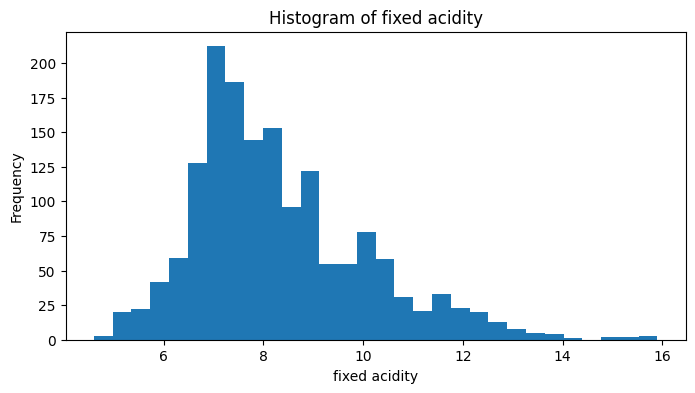

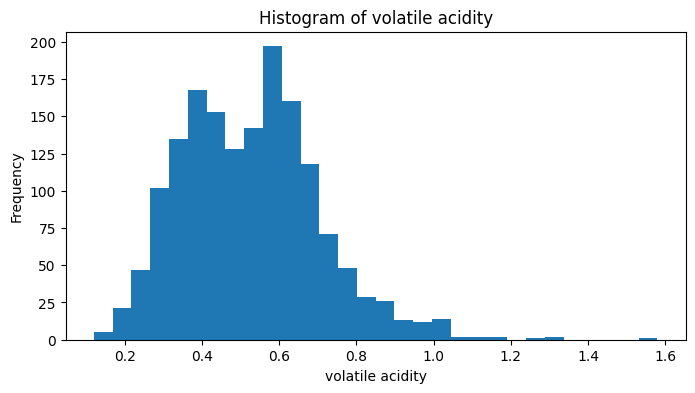

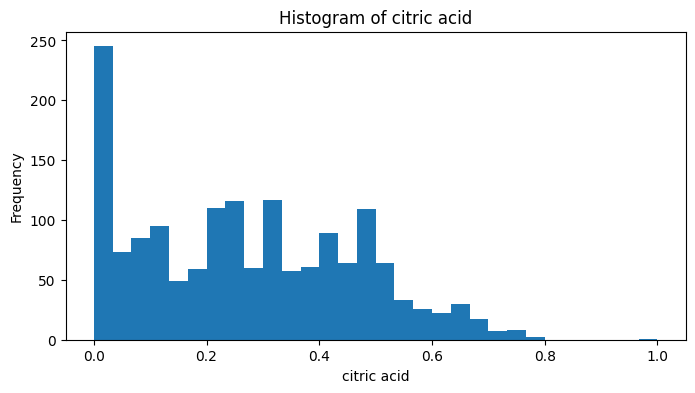

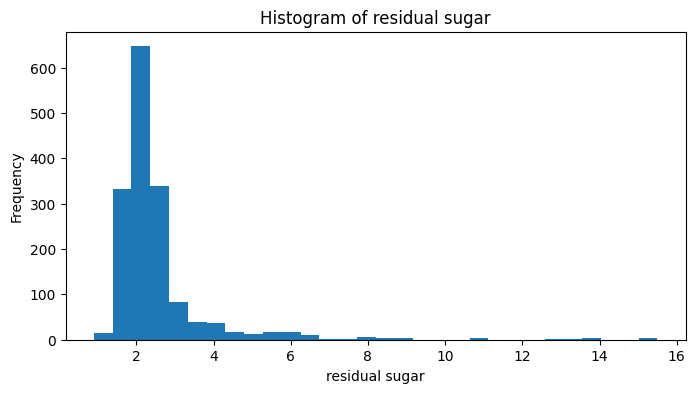

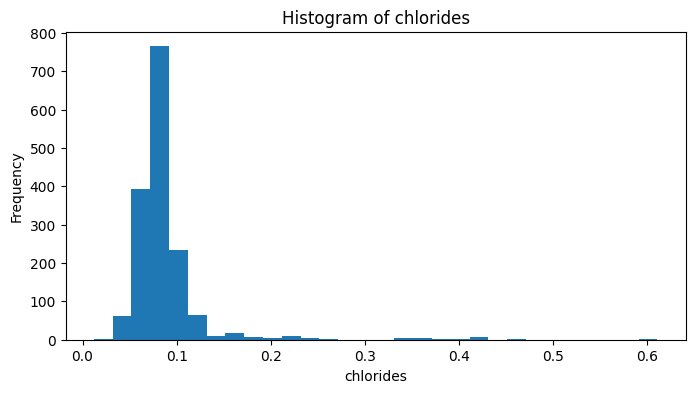

...

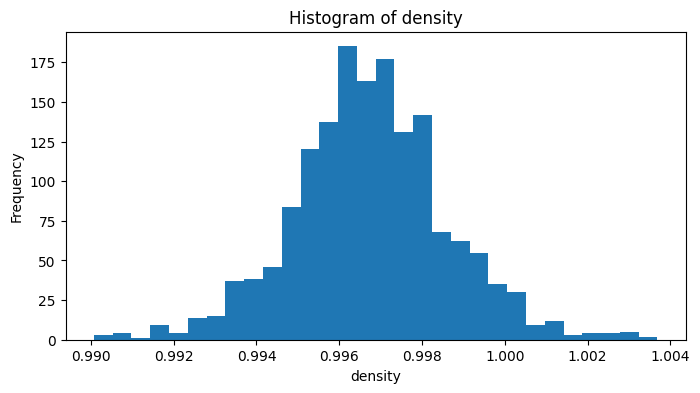

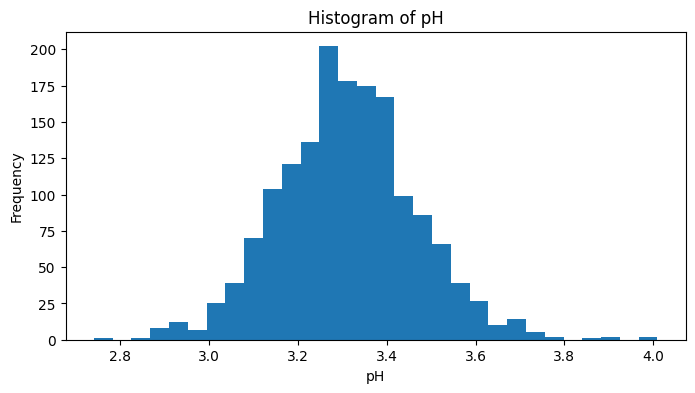

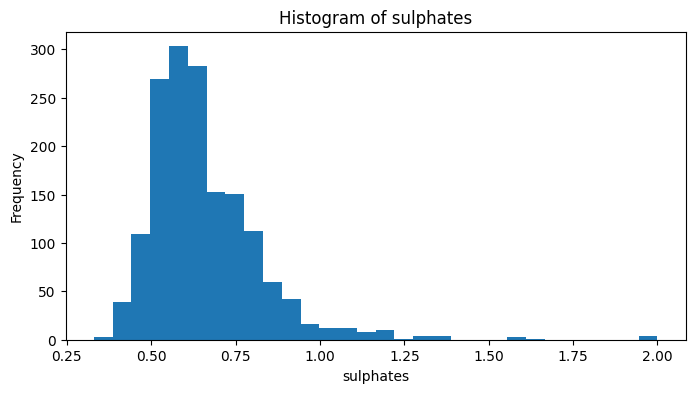

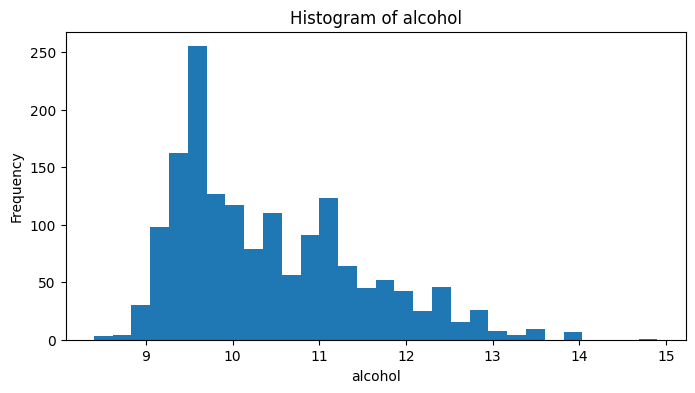

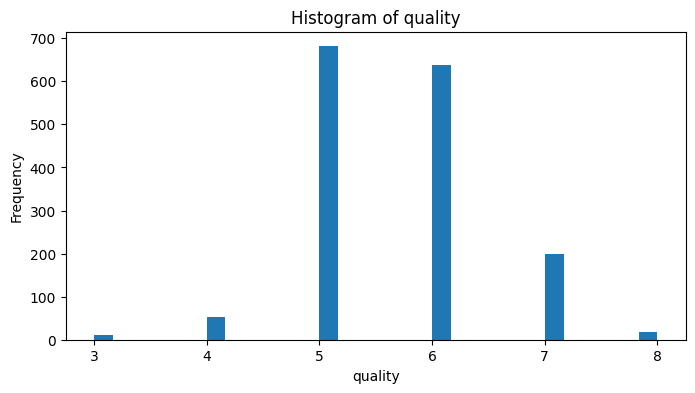

In [15]:
for column in df.select_dtypes(include=['number']):
  plt.figure(figsize=(8, 4))
  plt.hist(df[column], bins=30)
  plt.title(f'Histogram of {column}')
  plt.xlabel(column)
  plt.ylabel('Frequency')
  plt.show()


1)fixed acidity histogram is slightly right skewed and is unimodal

2)volatile acidity histogram is bimodal

3)citric acid histogram is rightly skewed

4)residual sugar histogram is bimodal

5)chlorides histogram is slightly left skewed and bimodal free sulphur dioxide histogram is bimodal and rightly skewed

6)total sulphur dioxide is rightly skewed

7)density histogram is almost bell shaped

8)pH histogram is slightly left skewed

9)sulphates histogram is very slightly right skewed

10)alcohol is rightly skewed

11)histogram of quality is slighly right skewed

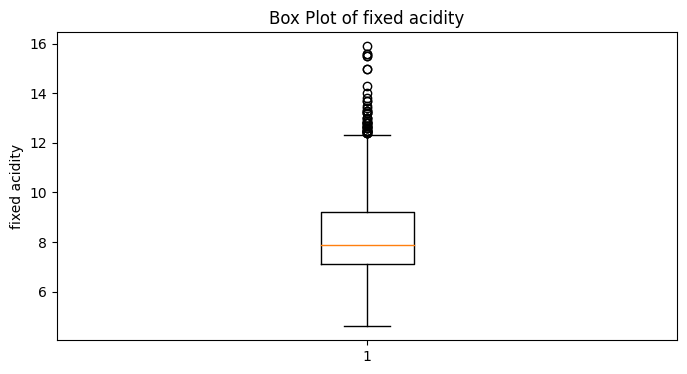

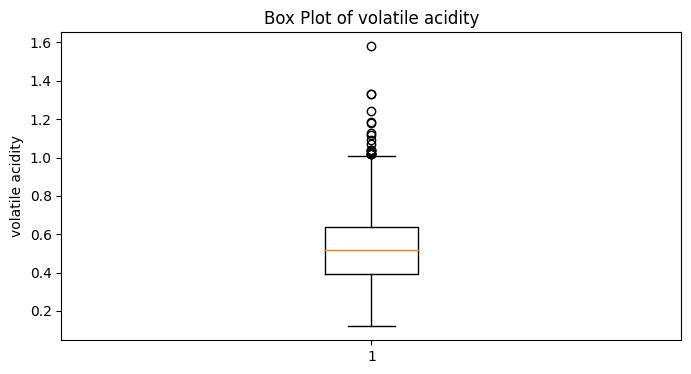

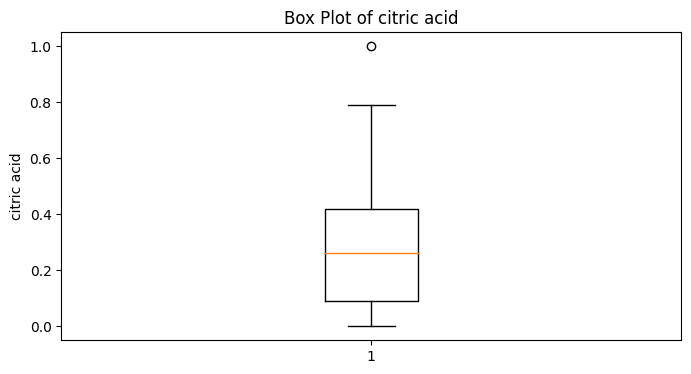

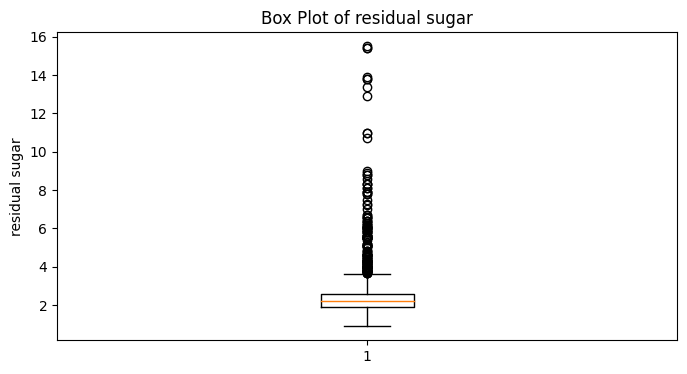

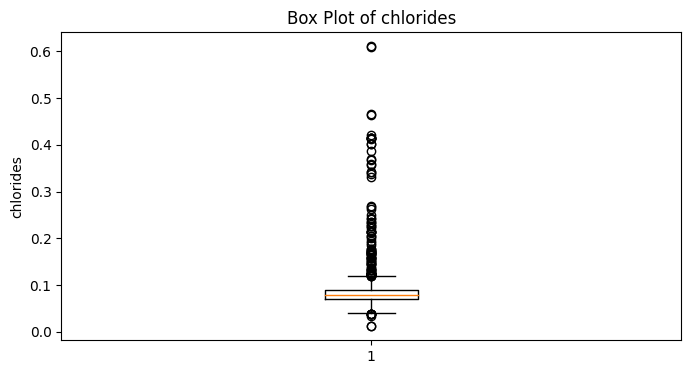

...

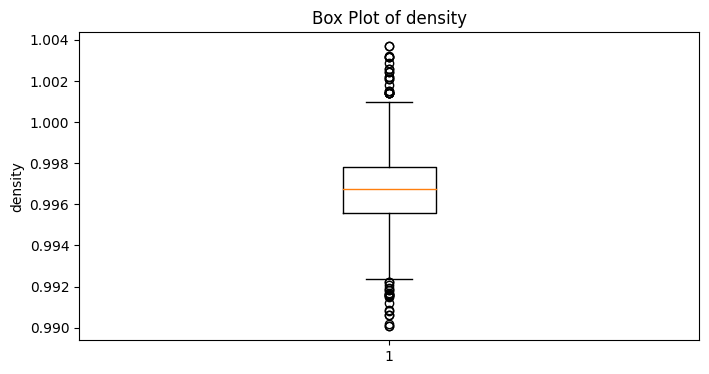

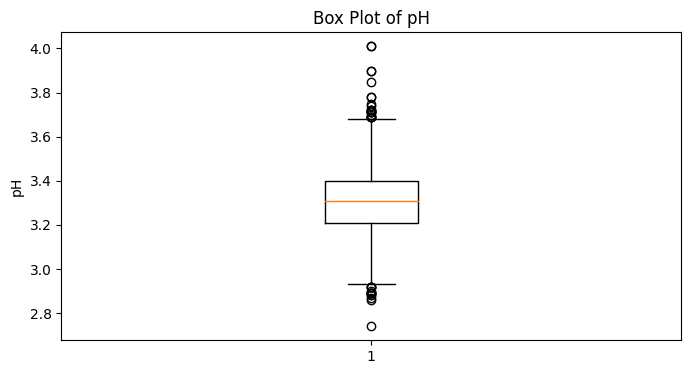

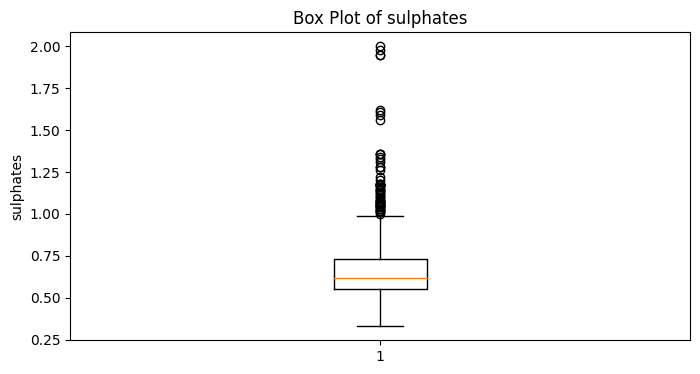

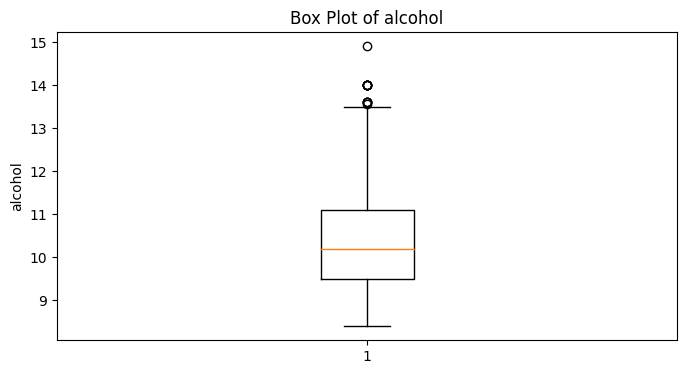

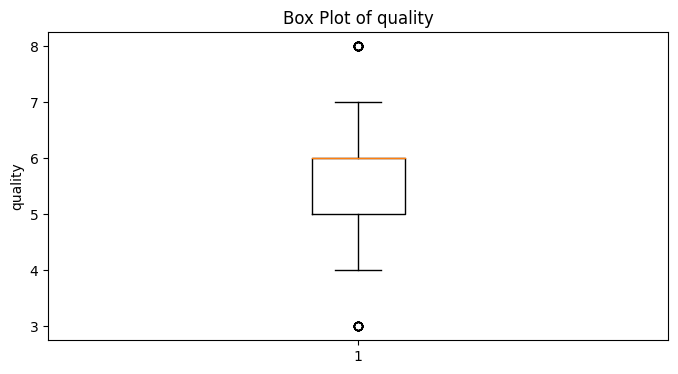

In [16]:
for column in df.select_dtypes(include=['number']):
  plt.figure(figsize=(8, 4))
  plt.boxplot(df[column])
  plt.title(f'Box Plot of {column}')
  plt.ylabel(column)
  plt.show()

In [17]:
def count_outliers_z_score(df):
    outlier_counts_z = {}
    for column in df.columns[:-1]:  # Exclude 'quality'
        mean = df[column].mean()
        std_dev = df[column].std()
        z_scores = (df[column] - mean) / std_dev
        outlier_count = ((z_scores < -3) | (z_scores > 3)).sum()  # Z-score threshold of 3
        outlier_counts_z[column] = outlier_count
    return outlier_counts_z

In [18]:
outliers_z_score = count_outliers_z_score(df)
print("Outlier counts using Z-score method:")
for column, count in outliers_z_score.items():
    print(f"{column}: {count} outliers")

Outlier counts using Z-score method:
fixed acidity: 12 outliers
volatile acidity: 10 outliers
citric acid: 1 outliers
residual sugar: 30 outliers
chlorides: 31 outliers
free sulfur dioxide: 22 outliers
total sulfur dioxide: 15 outliers
density: 18 outliers
pH: 8 outliers
sulphates: 27 outliers
alcohol: 8 outliers


In [19]:
def count_outliers_iqr(df):
    outlier_counts_iqr = {}
    for column in df.columns[:-1]:  # Exclude 'quality'
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outlier_count = ((df[column] < lower_bound) | (df[column] > upper_bound)).sum()
        outlier_counts_iqr[column] = outlier_count
    return outlier_counts_iqr

In [20]:
outliers_iqr = count_outliers_iqr(df)
print("\nOutlier counts using IQR method:")
for column, count in outliers_iqr.items():
    print(f"{column}: {count} outliers")


Outlier counts using IQR method:
fixed acidity: 49 outliers
volatile acidity: 19 outliers
citric acid: 1 outliers
residual sugar: 155 outliers
chlorides: 112 outliers
free sulfur dioxide: 30 outliers
total sulfur dioxide: 55 outliers
density: 45 outliers
pH: 35 outliers
sulphates: 59 outliers
alcohol: 13 outliers


Zscore is better to remove outlier in this case so using it

In [21]:
def remove_outliers_zscore(df, threshold=3):
  for column in df.select_dtypes(include=['number']):
    mean = np.mean(df[column])
    std = np.std(df[column])
    z_scores = [(x - mean) / std for x in df[column]]
    df.drop(df[abs(np.array(z_scores)) > threshold].index, inplace=True)
  return df

df = remove_outliers_zscore(df)

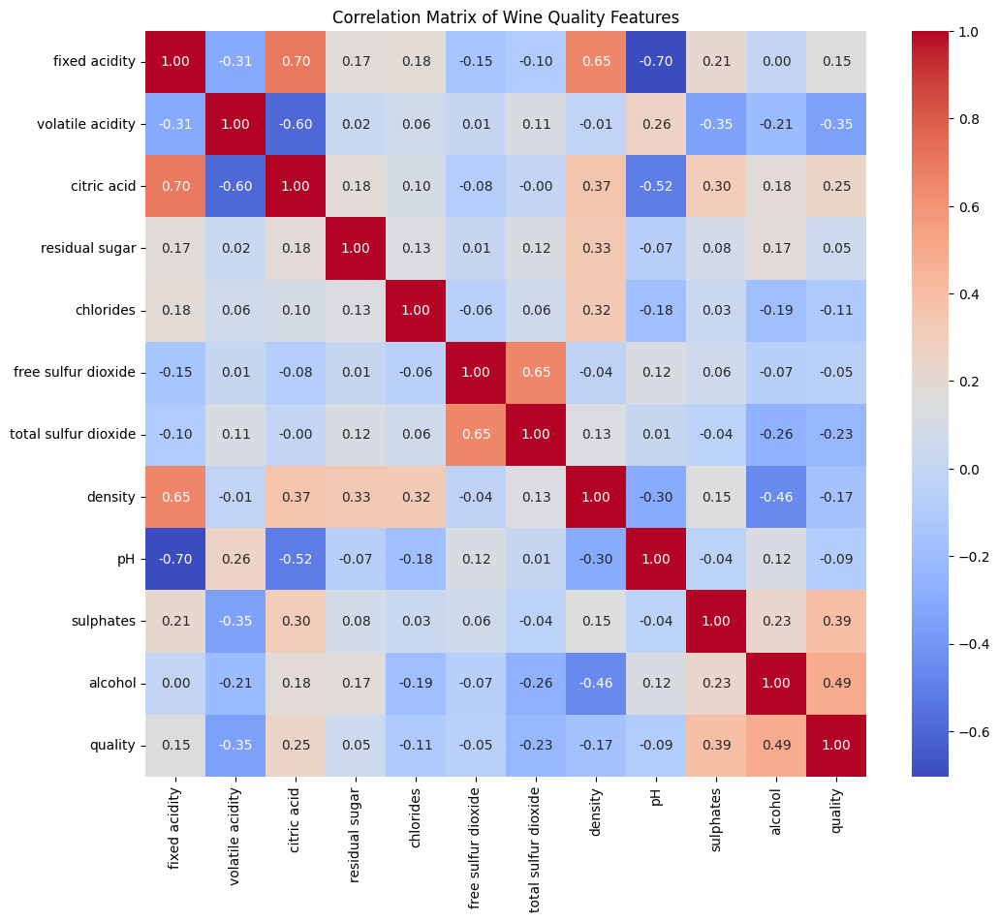

In [24]:
#Correlation Matrix Heatmap
correlation_matrix = df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Wine Quality Features')
plt.show()

#Strong Positive Correlation:
# - Fixed Acidity and Citric Acid: 0.67. This indicates that wines with higher fixed acidity tend to have higher citric acid content.
# - Fixed Acidity and Density: 0.67. Wines with higher fixed acidity tend to have a higher density.
# - Volatile Acidity and pH: -0.39. Wines with higher volatile acidity tend to have lower pH.
# - Alcohol and Quality: 0.48. Wines with higher alcohol content tend to be rated higher in quality.
# - Sulphates and Quality: 0.25. Wines with higher sulphates tend to be rated higher in quality.

# Moderate Positive Correlation:
# - Citric Acid and Density: 0.36. Wines with higher citric acid tend to have higher density.
# - Chlorides and Density: 0.37. Wines with higher chloride levels tend to have a higher density.
# - Free Sulfur Dioxide and Total Sulfur Dioxide: 0.67. Wines with higher free sulfur dioxide usually have higher total sulfur dioxide.

# Moderate Negative Correlation:
# - pH and Fixed Acidity: -0.68. Wines with higher pH tend to have lower fixed acidity.
# - Volatile Acidity and Quality: -0.39. Wines with higher volatile acidity tend to have lower quality ratings.
# - Density and Quality: -0.17. Wines with higher density tend to have lower quality ratings.

# Weak Correlation:
# - Several features have very weak correlations with quality, suggesting they may not be as important factors in determining wine quality.


# Insights:
# - Alcohol content is one of the strongest positive correlates of wine quality, which is consistent with general wine knowledge.
# - Volatile acidity has a significant negative correlation with quality, suggesting that lower levels of volatile acidity are desirable.
# - Acidity-related features (fixed acidity, citric acid, pH) are closely interconnected, indicating that these aspects of a wine are inter-related.
# - Sulfur dioxide levels, both free and total, are moderately correlated. This might suggest that total sulfur dioxide primarily depends on the level of free sulfur dioxide.


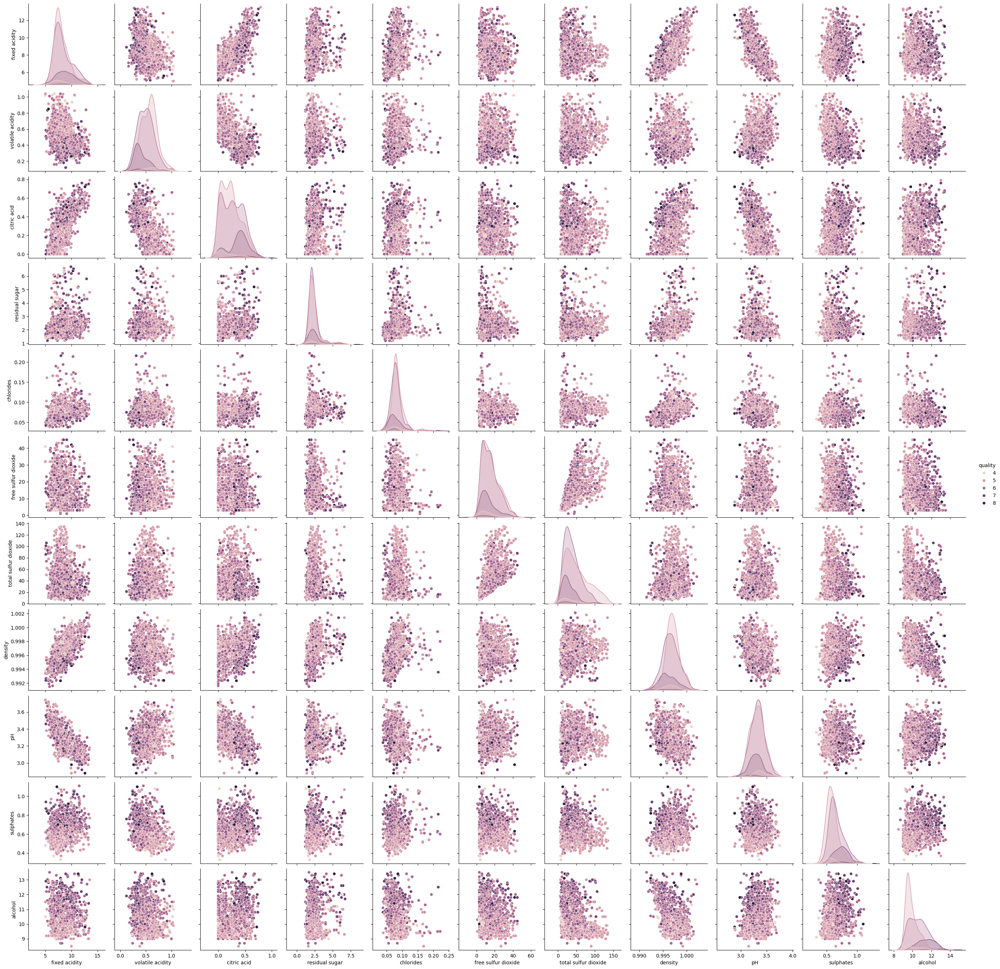

In [25]:
import seaborn as sns
# Pairplot for Visualizing Relationships
sns.pairplot(df, hue='quality')
plt.show()

# 1. Diagonal Plots (Histograms):
#    - Show the distribution of each feature individually.
#    - We can observe the skewness and modality of the variables (e.g., alcohol is right-skewed, quality is slightly right-skewed).

# 2. Scatter Plots (Off-Diagonal):
#    - Show the relationship between pairs of features.
#    - We can visually assess the correlation between features.
#    - Color-coded by quality allows us to understand how different quality ratings relate to the feature combinations.

# Some Observations from the Pairplot:

# - Alcohol vs. Quality: There's a noticeable positive trend between alcohol content and quality. Wines with higher alcohol tend to be rated higher.
# - Volatile Acidity vs. Quality: There seems to be a negative relationship. Wines with lower volatile acidity are more likely to have higher quality ratings.
# - Density vs. Other Features: Density shows some correlation with features like fixed acidity and citric acid, indicating that wines with higher density tend to have higher acidity levels.
# - Quality Clusters: The scatter plots may reveal some clustering of data points according to quality. This suggests that certain combinations of features are more associated with particular quality levels.
# - Outliers: Some outliers are visible in the plots, especially for features like volatile acidity and chlorides.


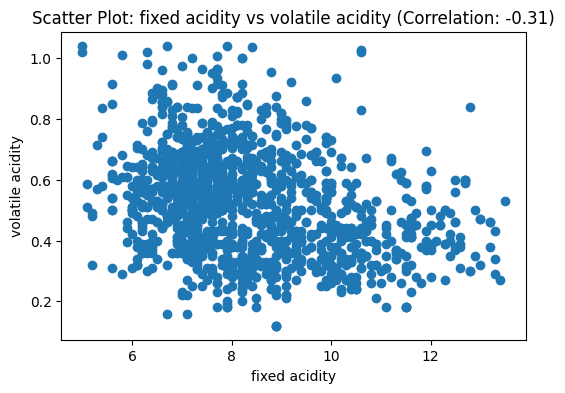

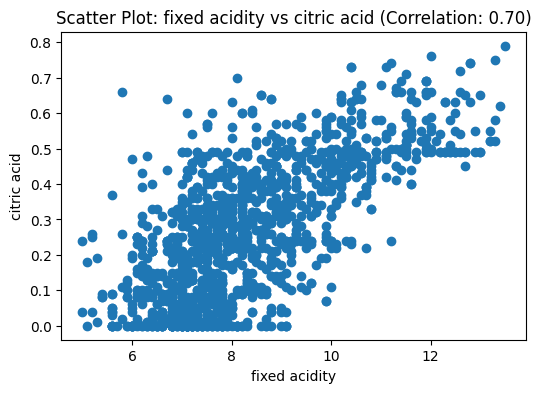

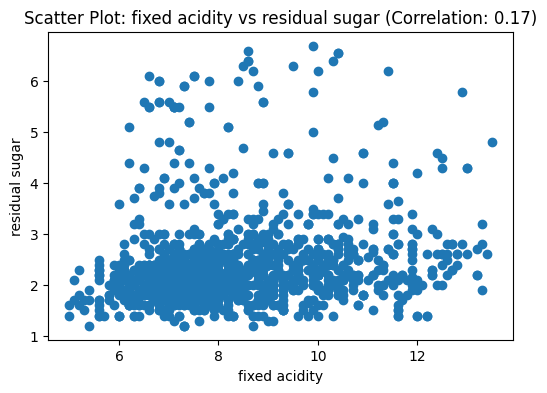

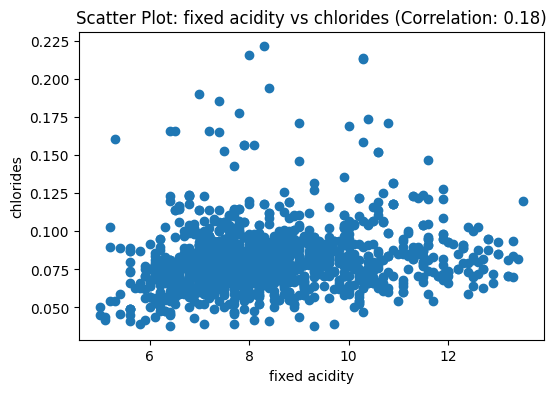

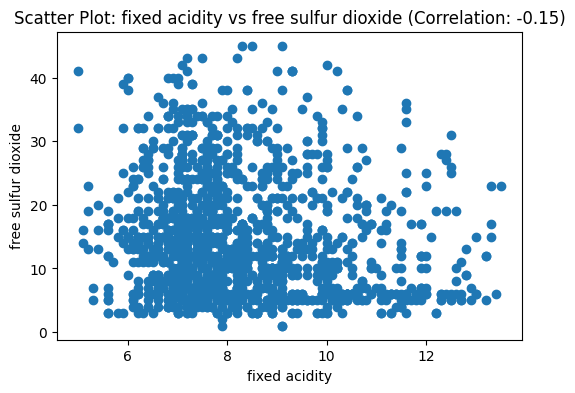

...

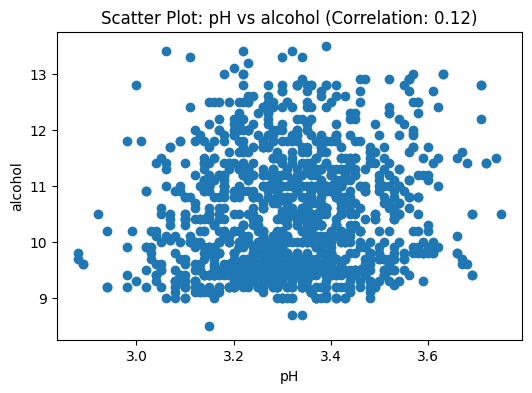

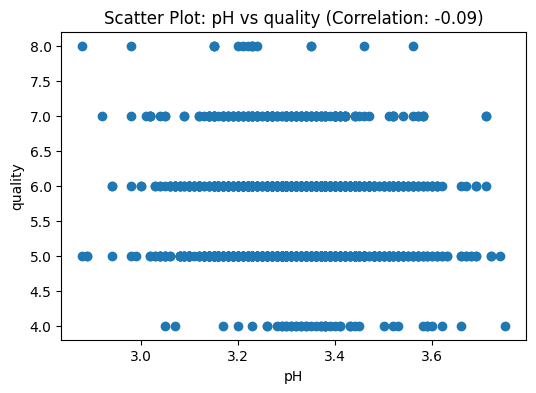

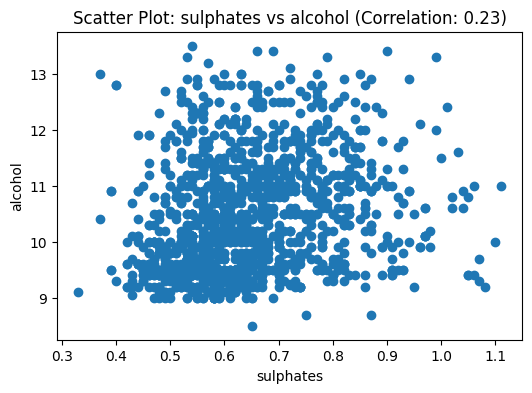

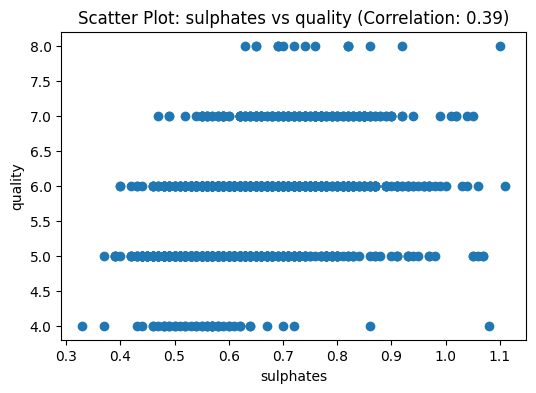

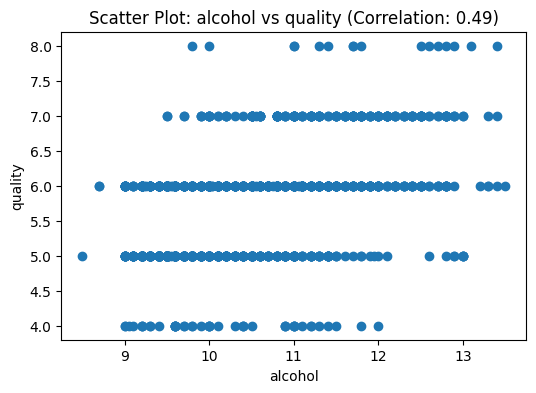

In [26]:
#Iterate through pairs of features and create scatter plots with correlation coefficients
for i in range(len(df.columns)):
  for j in range(i + 1, len(df.columns)):
    feature1 = df.columns[i]
    feature2 = df.columns[j]

    correlation = df[feature1].corr(df[feature2])

    plt.figure(figsize=(6, 4))
    plt.scatter(df[feature1], df[feature2])
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    plt.title(f"Scatter Plot: {feature1} vs {feature2} (Correlation: {correlation:.2f})")
    plt.show()

 # - Alcohol vs. Quality: The scatter plot likely shows a positive and somewhat linear correlation, indicating that wines with higher alcohol content tend to be rated higher in quality.
# - Volatile Acidity vs. Quality: The scatter plot might show a negative correlation, suggesting that wines with lower volatile acidity are more likely to have higher quality ratings.
# - Density vs. Fixed Acidity: The plot might show a positive correlation, indicating that wines with higher density tend to have higher fixed acidity.
# - Citric Acid vs. pH: The scatter plot might show a negative correlation, suggesting that wines with higher citric acid levels tend to have lower pH values.


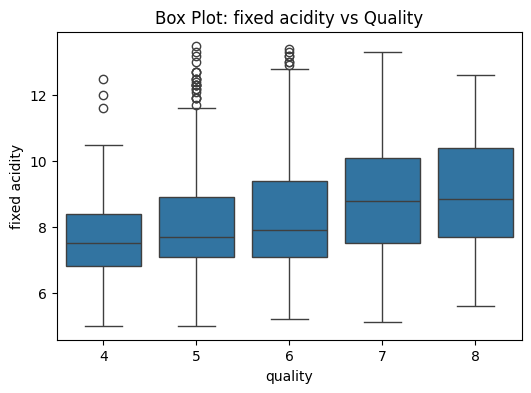

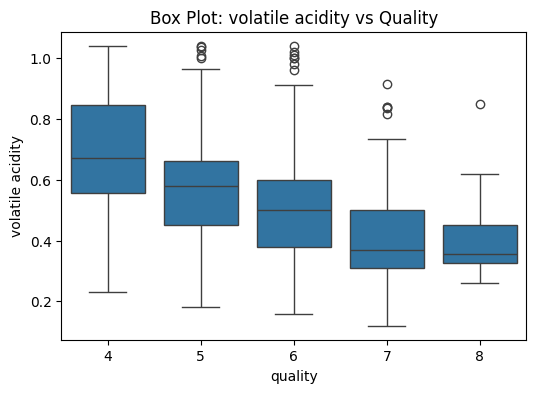

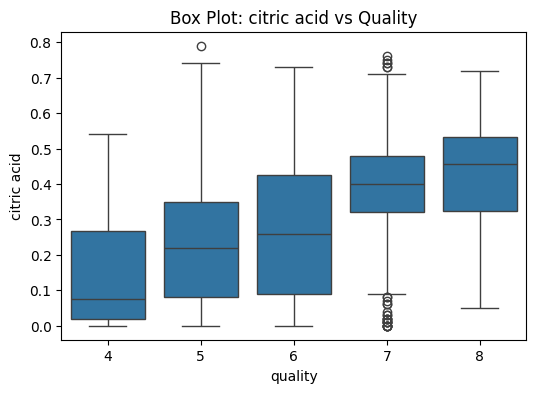

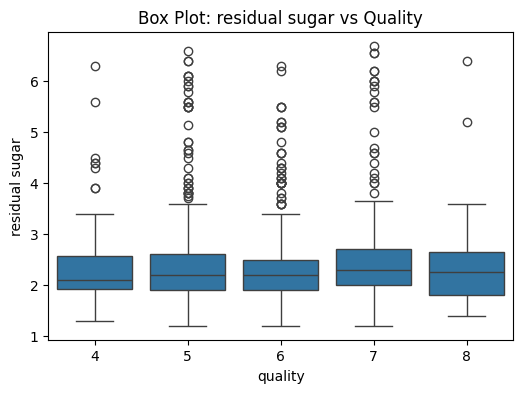

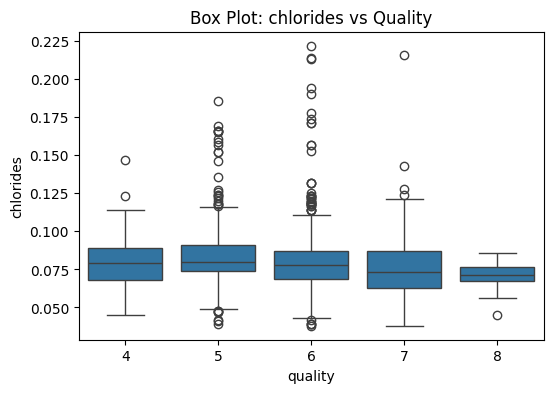

...

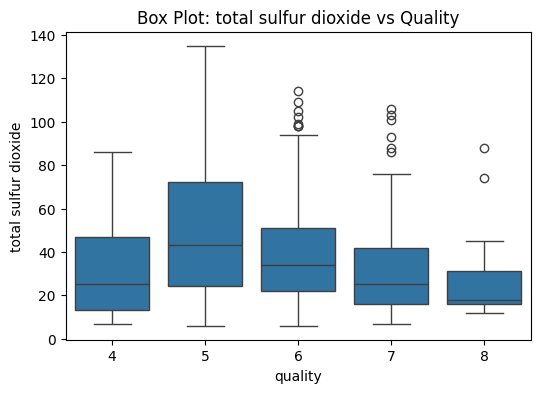

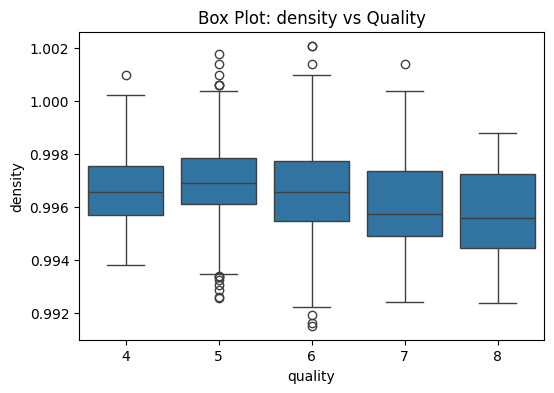

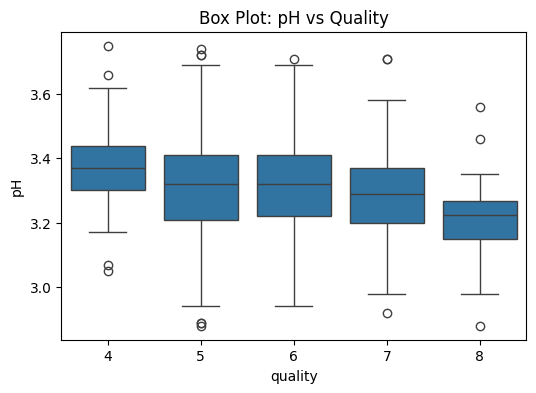

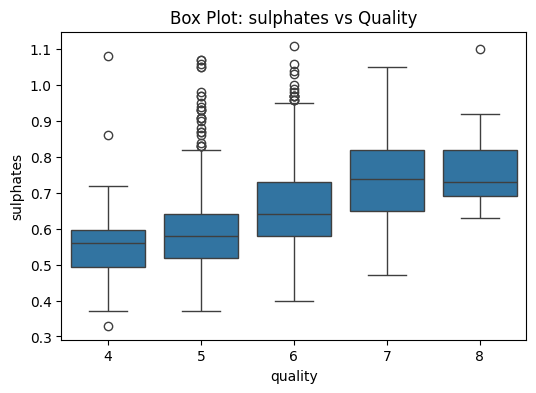

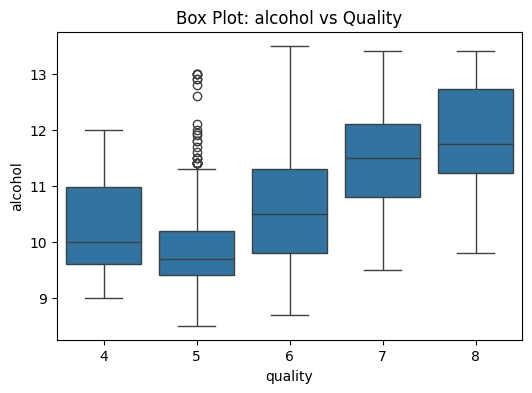

In [27]:
# Boxplots for quality against each feature
for feature in df.columns[:-1]:
  plt.figure(figsize=(6, 4))
  sns.boxplot(x='quality', y=feature, data=df)
  plt.title(f"Box Plot: {feature} vs Quality")
  plt.show()

1. Alcohol:
#     As the wine quality increases, the median alcohol content generally increases as well.
#     This suggests a positive relationship between alcohol content and quality, consistent with our earlier findings from the correlation matrix and scatter plots.
#     The IQR also tends to increase with higher quality, indicating that better wines often have a wider range of alcohol content.
# 2. Volatile Acidity:
#     Generally, wines with higher quality tend to have a lower median volatile acidity.
#     This supports our previous observations that lower volatile acidity is associated with better quality.
#     There are some outliers, particularly in the lower-quality wines, which might have unusually high volatile acidity.
# 3. Sulphates:
#     The median sulphate content appears slightly higher for higher-quality wines.
#     This suggests a positive, though potentially weak, relationship between sulphates and quality.
# 4. Citric Acid:
#     There's a tendency for higher-quality wines to have a higher median citric acid level.
#     This is consistent with the positive correlation observed earlier between citric acid and quality.
# 5. pH:
#     The median pH value might show some variation across quality levels, but it's not as clear-cut as with alcohol or volatile acidity.
#     This indicates that pH might not be as strongly linked to quality compared to other features.
# 6. Other Features (e.g., Fixed Acidity, Density, Chlorides):
#     These features may show some variation in distribution across quality levels, but their relationship with quality is not as evident as with alcohol or volatile acidity.
